In [16]:
%matplotlib inline
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
from matplotlib import style
import seaborn as sns
from pylab import rcParams
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import pmdarima as pm
import numpy as np
warnings.filterwarnings("ignore")

style.use('fivethirtyeight')
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

In [19]:
df = pd.read_csv('event_count_data.csv', header =1)
df['Date'] = df['Date'].apply(lambda x: pd.to_datetime(x).date())
df.set_index('Date', inplace = True)
df.fillna(0, inplace = True)  #there are no zero counts, assuming null has no extra meaning

alert = pd.read_csv('alert.csv')
alert['Date'] = alert['Date'].apply(lambda x: pd.to_datetime(x).date())
alert.set_index('Date', inplace = True)
# alert.fillna(0, inplace = True) 

df = df[alert.columns]

In [20]:
df.head()

,Event 1,Event 2,Event 3,Event 4,Event 5,Event 6,Event 7,Event 8,Event 9,Event 10,...,Event 35,Event 36,Event 37,Event 38,Event 39,Event 40,Event 41,Event 42,Event 43,Event 44
Date,,,,,,,,,,,,,,,,,,,,,
2018-02-10,131467,0.0,0.0,1404,319,0.0,0.0,0.0,8830,0.0,...,280527,0.0,0.0,0.0,0.0,0.0,925.0,3793,33791,0.0
2018-02-11,125960,0.0,0.0,1324,362,0.0,0.0,0.0,8246,0.0,...,263300,0.0,0.0,0.0,0.0,0.0,843.0,3561,32080,0.0
2018-02-12,138004,0.0,0.0,1516,245,0.0,0.0,0.0,9454,0.0,...,284974,0.0,0.0,0.0,0.0,0.0,1018.0,3978,40014,0.0
2018-02-13,144078,0.0,0.0,1753,203,0.0,0.0,1.0,10034,0.0,...,308779,0.0,0.0,0.0,0.0,0.0,1082.0,4186,45778,0.0
2018-02-14,129852,0.0,0.0,1446,419,0.0,0.0,0.0,8949,0.0,...,282318,0.0,0.0,0.0,0.0,0.0,812.0,3821,32796,0.0


### Please explore the dataset and answer the following:
 1. If you were part of the data team during this period, which types of changes in the data would you have wanted to know about in real-time?
 2. What are some concrete events and dates that exemplify the changes you described in (1)?
     1. when a metric begins tracking: several events start off with zero or very low activity and seem to be switched on, for example event 19 and 20 on 3/1. This might be detected in the same way as a trend change but messaging/urgency would likely be different.
     - additive anomalies, spikes and drops in metrics: several events have a spike in activity around 3/27-3/28, for example events 1, 4, 9, 22. Event 32 is an example with several others. 
     - when metrics that were non-zero drop very low or to zero: event 31 has periods of where the metric seems to be not tracking at 5/5 and 6/5. Other metrics have shorter drops to low activity, like event 22 around 4/9
     - trend changes and level shifts: event 12 and event 29 show level shifts, where there is a step change in the moving average.
     - maybe-- if seasonal/cyclical patterns stop happening: event 27 had a really strong weekly pattern that drops off with the moving average (haven't looked into this too much and the scale may be throwing me off, but it might be interesting if expected seasonal disappears)
     - maybe-- frequency of events: some events like 21, 13, 2, 37 are rare but maybe are expected at certain frequency. tracking the time between those events and finding outliers may be useful.


#### time series plots with moving 7 day average

- manually labeled each event column when the changes A-D are observed, not split up by type (done coarsely/quickly, expect plenty of human error)
- plot with moving average to start. 7 days because many events show weekly seasonality


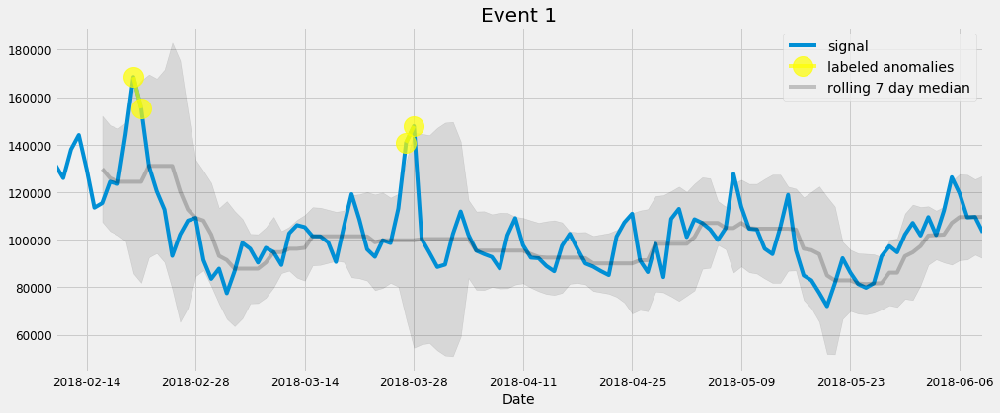

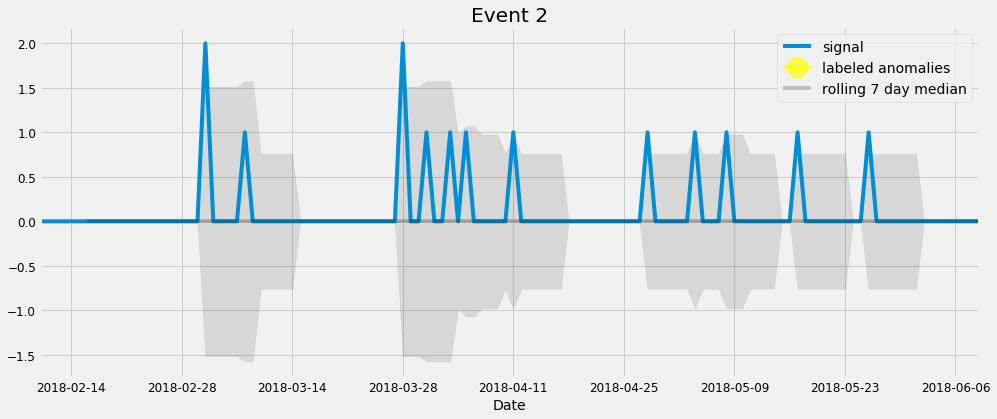

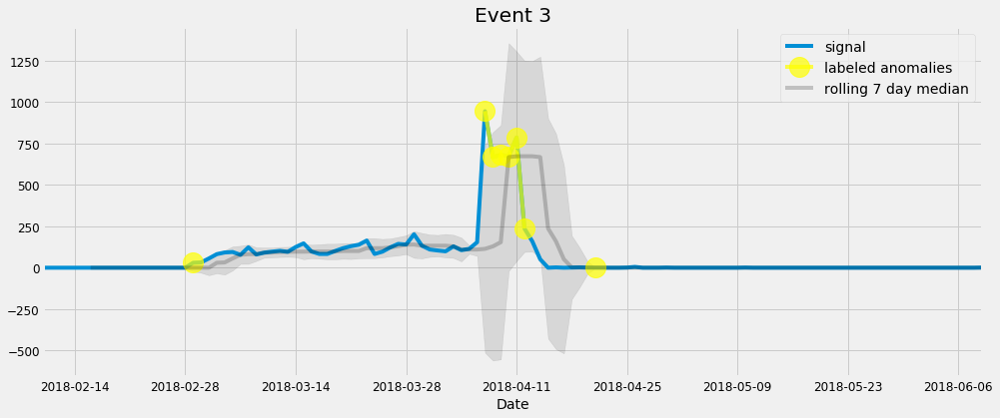

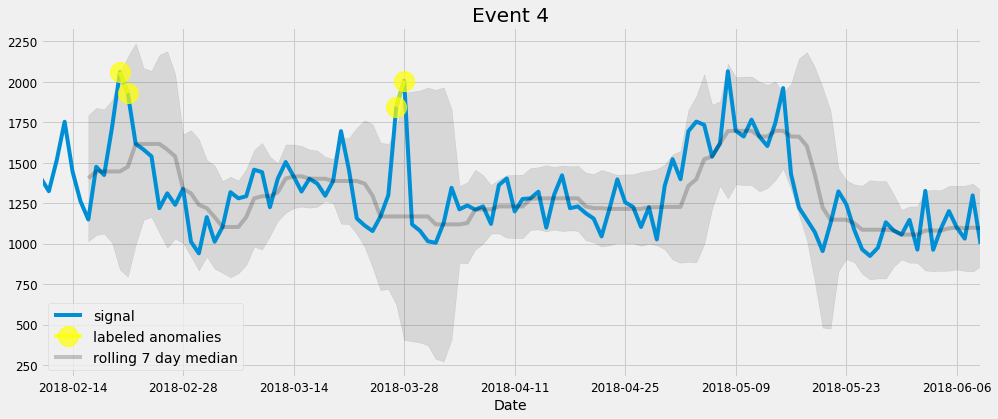

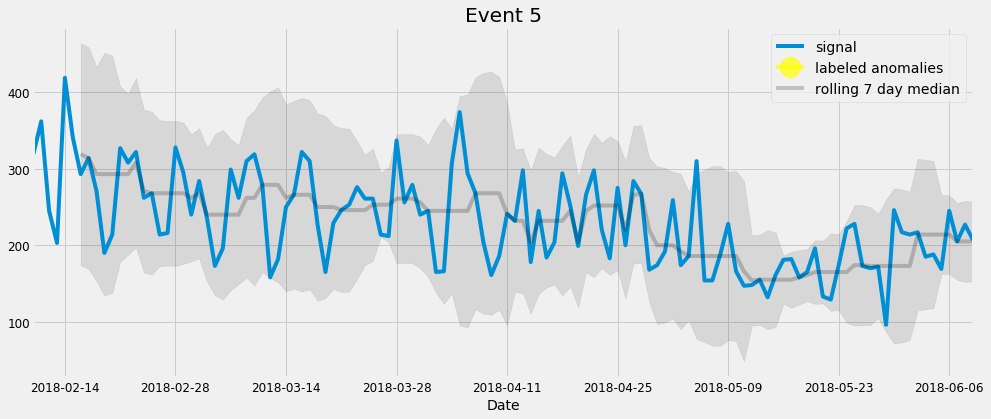

...

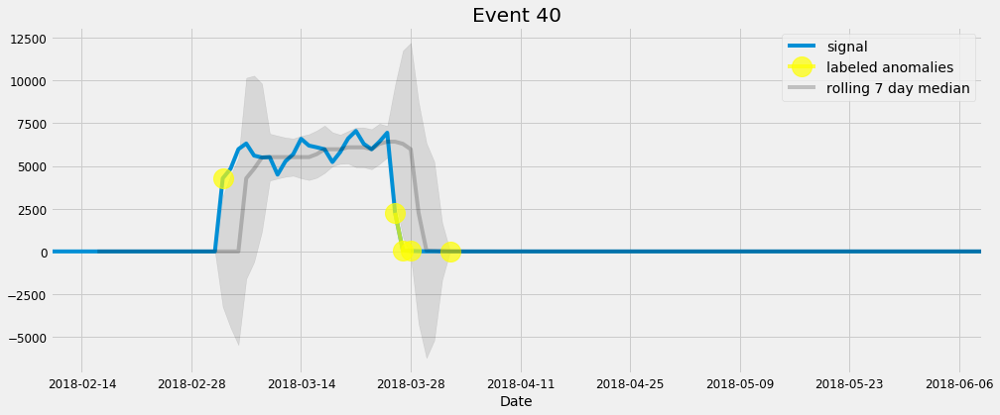

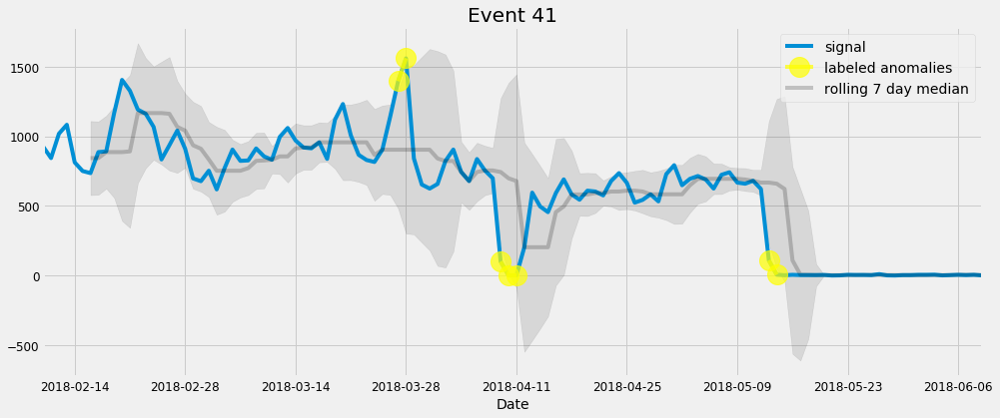

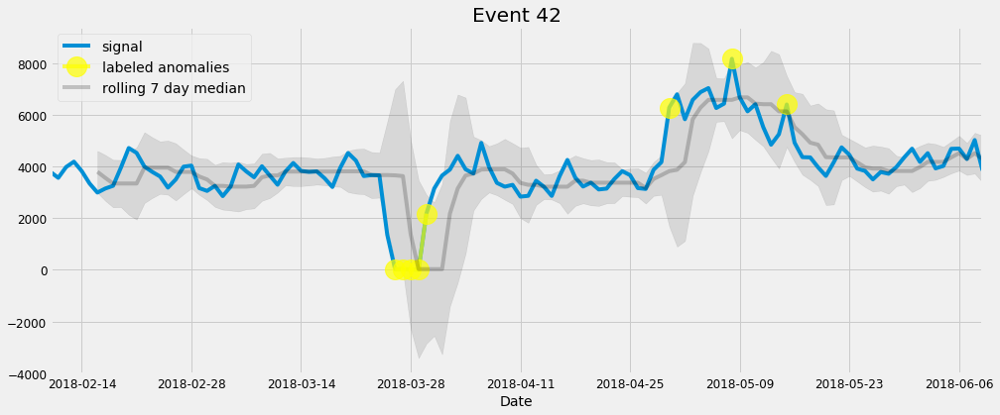

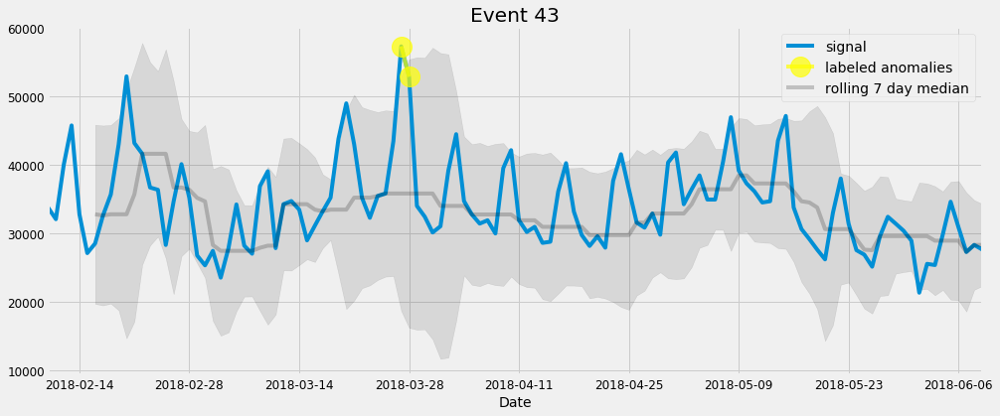

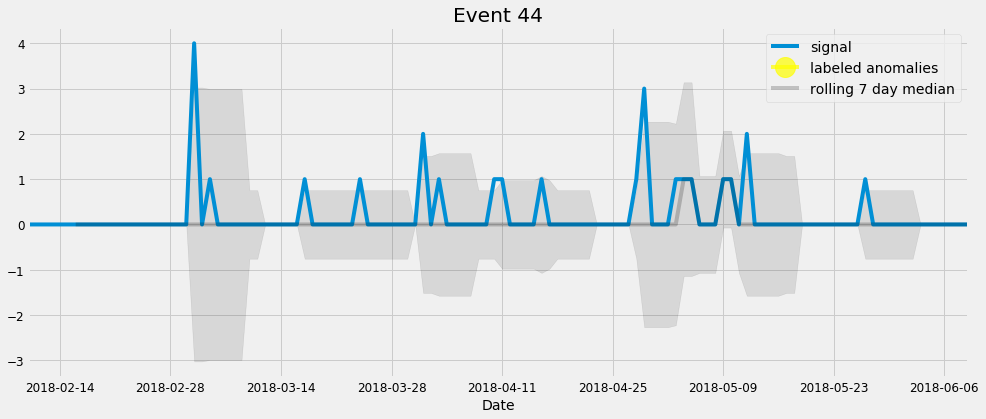

In [21]:
for col in df.columns:
    fig, ax = plt.subplots(figsize=(15, 6))
    df[col].plot(ax = ax, label = 'signal')
    (alert[col]*df[col]).plot(ax = ax, marker = 'o',markersize =20, alpha = 0.7, c = 'yellow', label = 'labeled anomalies')
    df[col].rolling(7).median().plot(ax = ax, alpha = 0.2, label = 'rolling 7 day median', color = 'k')
    ax.fill_between(df[col].index,
                df[col].rolling(7).median()-2*df[col].rolling(7).std(),
                df[col].rolling(7).median()+2*df[col].rolling(7).std(), color='k', alpha=.1)
    ax.set_title(col)
    ax.legend()
    plt.show()
    
    

#### time series plots with moving 7 day average of difference

- differencing the data removes most trends, highlights noise

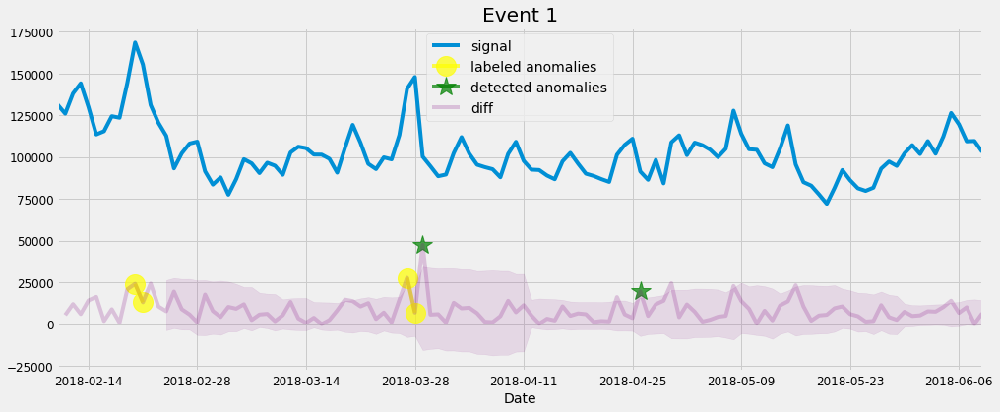

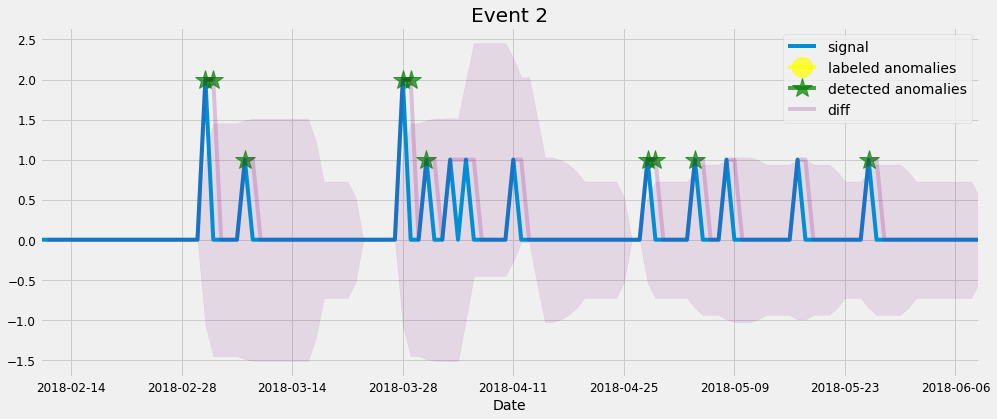

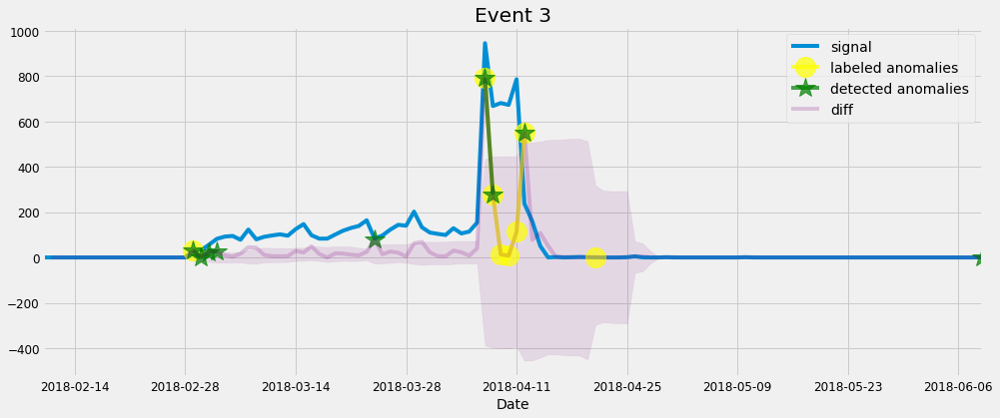

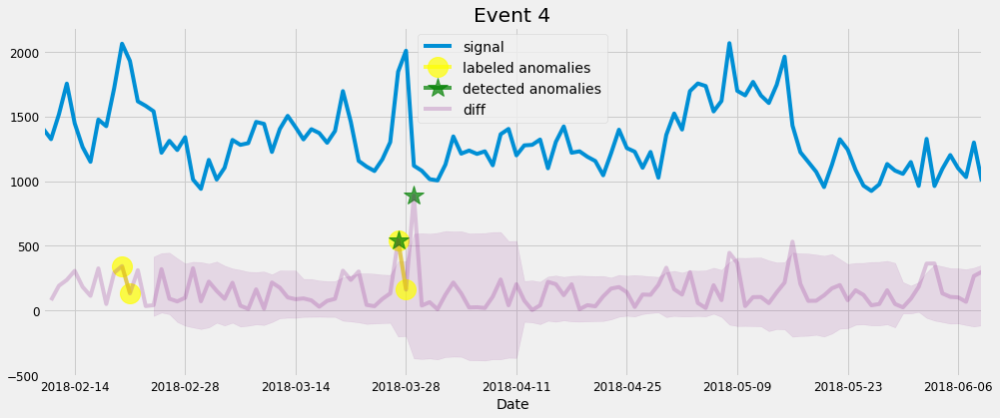

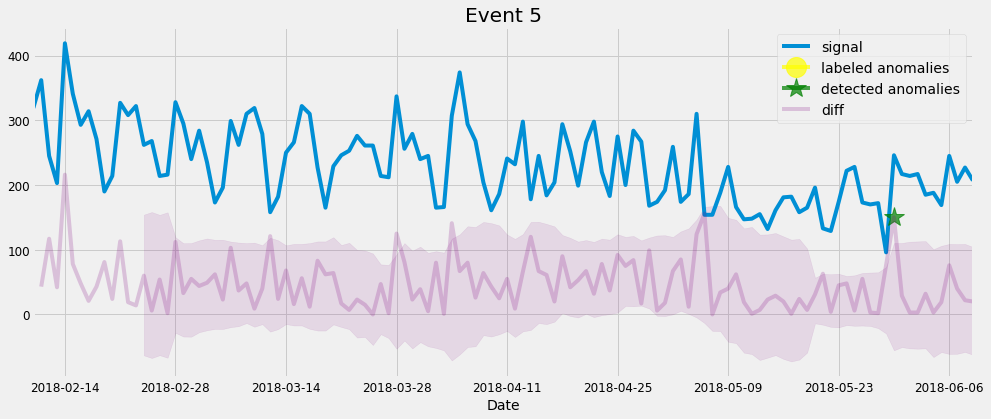

...

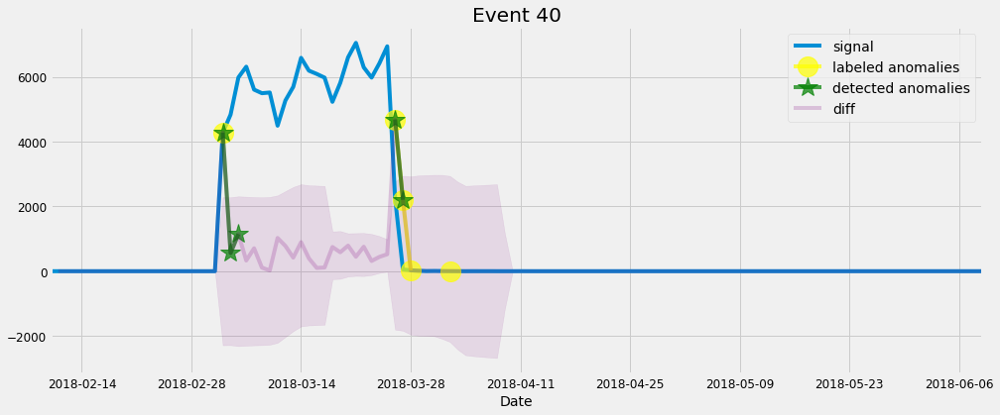

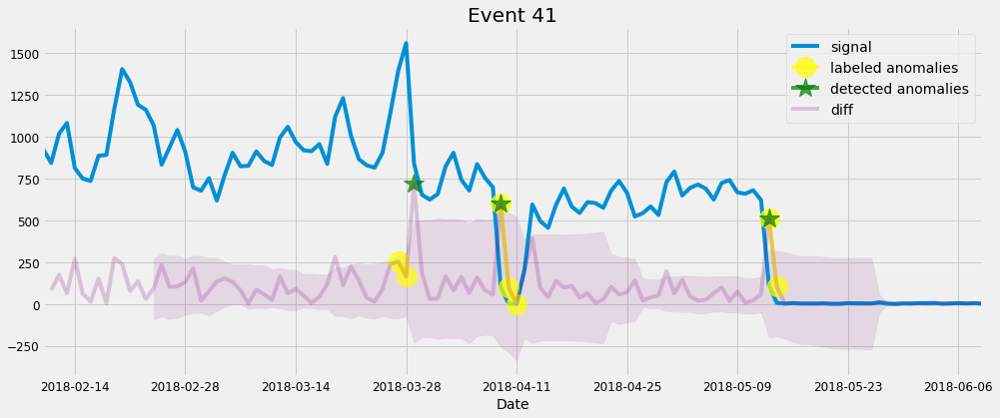

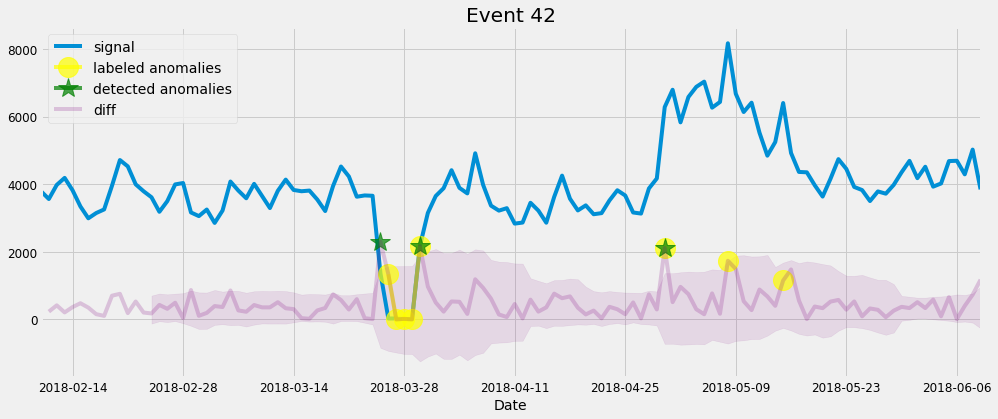

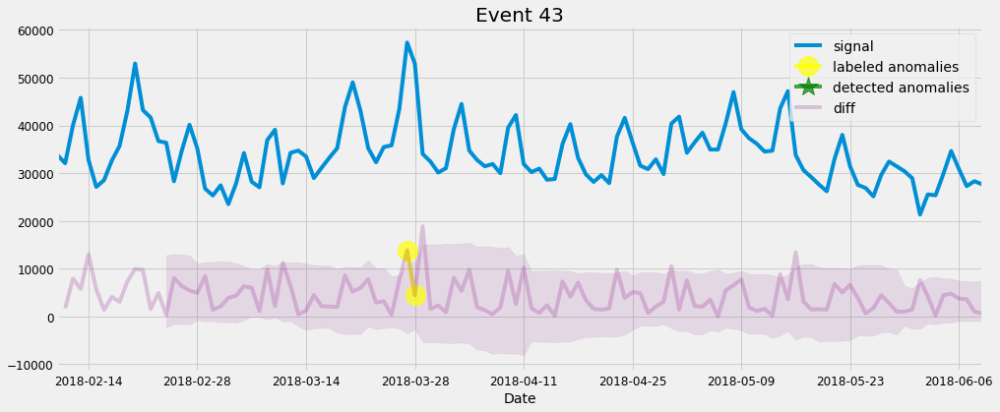

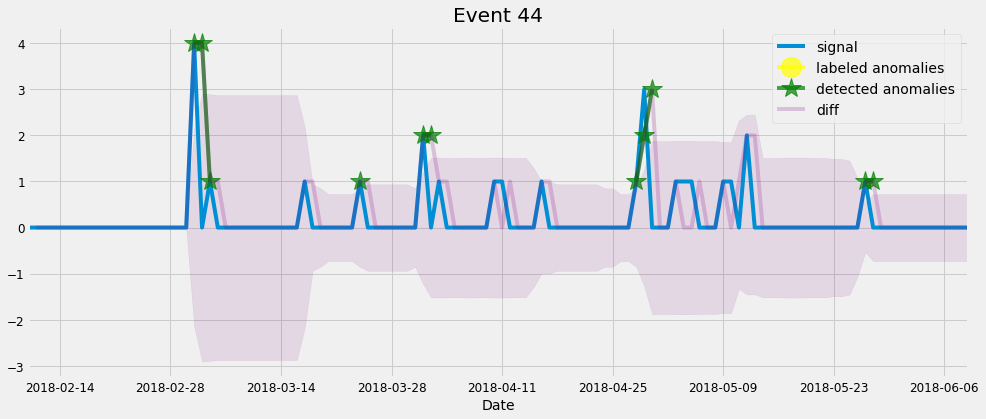

In [22]:
eval_ = pd.DataFrame()
window = 14
num_std = 2
for col in df.columns:
    fig, ax = plt.subplots(figsize=(15, 6))
    df[col].plot(ax = ax, label = 'signal')
    metric = df[col].diff().abs()
    detected = ((metric > metric.rolling(window).median()+num_std*metric.rolling(window).quantile(.75)) & 
        (metric.rolling(window).median().notnull()))
    detected = detected[detected].astype(int)

    (alert[col]*metric).plot(ax = ax, marker = 'o',markersize =20, alpha = 0.7, c = 'yellow', label = 'labeled anomalies')
    (detected*metric).plot(ax = ax, marker = '*',markersize =20, alpha = 0.7, c = 'green', label = 'detected anomalies')
    
    metric.plot(ax = ax, alpha = 0.2, label = 'diff', color = 'purple')
    ax.fill_between(df[col].index,
                metric.rolling(window).median()-num_std*metric.rolling(window).std(),
                metric.rolling(window).median()+num_std*metric.rolling(window).std(), color='purple', alpha=.1)
    ax.set_title(col)
    ax.legend()
    plt.show()
    
    r = pd.DataFrame({'truth': alert[col]})
    r['detected'] = detected
    r.fillna(0, inplace = True)
    eval_ = eval_.append(r)
    

In [23]:


tp = ((eval_['truth'] == 1) &  (eval_['detected'] ==1)).sum()
fp = ((eval_['truth'] == 0) &  (eval_['detected'] ==1)).sum()
tn = ((eval_['truth'] == 0) &  (eval_['detected'] ==0)).sum()
fn = ((eval_['truth'] == 1) &  (eval_['detected'] ==0)).sum()

precision = (tp/(tp+fp)) #ability of a classification model to return only relevant instances 
recall = (tp/(tp+fn)) #ability of a classification model to identify all relevant instances

print('precision', precision)
print('recall', recall)

precision 0.2087378640776699
recall 0.3706896551724138


### ARIMA model for proof of concept

- to some extent this could be generalized so that the best model is chosen for each but some things like detecting seasonality automatically are difficult.
- the idea is to make a forecast and alert when the data deviates from the forecast
- not looking into how good the fit is right now, using the dickey fuller test for stationarity to set d, then trusting the autofit 
- fitting on all the data.. to properly evaluate this, would have to have more historic data

proof of concept with event 22

Fit ARIMA: order=(1, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=1397.466, BIC=1405.622, Fit time=0.080 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 7); AIC=1397.679, BIC=1403.116, Fit time=0.016 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 7); AIC=1378.526, BIC=1389.400, Fit time=0.201 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=1340.785, BIC=1351.659, Fit time=0.317 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 7); AIC=1342.679, BIC=1356.272, Fit time=0.377 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 7); AIC=1396.724, BIC=1404.880, Fit time=0.037 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 7); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 7); AIC=1344.542, BIC=1360.853, Fit time=1.107 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 7); AIC=1342.606, BIC=1356.198, Fit time=0.751 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 

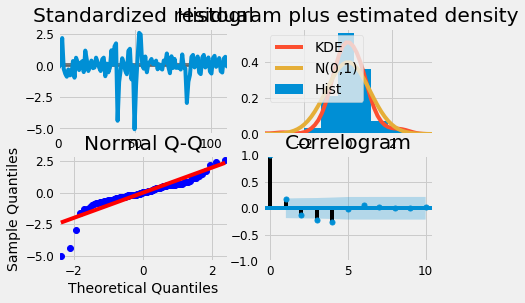

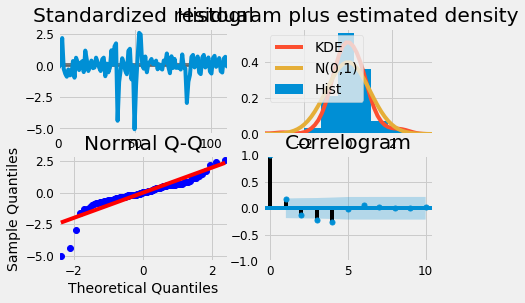

In [24]:
y = df['Event 22']

results = pm.auto_arima(y, 
                        d = 1, 
                        start_p = 1, 
                        start_q = 0, 
                        max_p = 2, 
                        max_q = 2, 
                        seasonal = True,
                        m = 7,
                        D = 1,
                        start_P = 0, 
                        start_Q = 0, 
                        max_P = 2, 
                        max_Q = 2, 
                        information_criterion = 'bic',
                        trace = True,
                        error_action = 'ignore')
results.summary()
results.plot_diagnostics()

In [25]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                
=========================================================================================
Dep. Variable:                                 y   No. Observations:                  120
Model:             SARIMAX(0, 1, 0)x(0, 1, 1, 7)   Log Likelihood                -668.611
Date:                           Tue, 02 Jul 2019   AIC                           1343.222
Time:                                   13:15:01   BIC                           1351.377
Sample:                                        0   HQIC                          1346.531
                                           - 120                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.5820      2.229     -0.261      0.794      -4.951       3.787
ma.S.L7       -0.9708      0.524     -1.854      0.064      -1.997       0.056
sigma2      7726.6885   3765.896      2.052      0.040     345.668    1.51e+04
===================================================================================
Ljung-Box (Q):                       79.87   Jarque-Bera (JB):               370.68
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.26   Skew:                            -1.70
Prob(H) (two-sided):                  0.48   Kurtosis:                        11.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

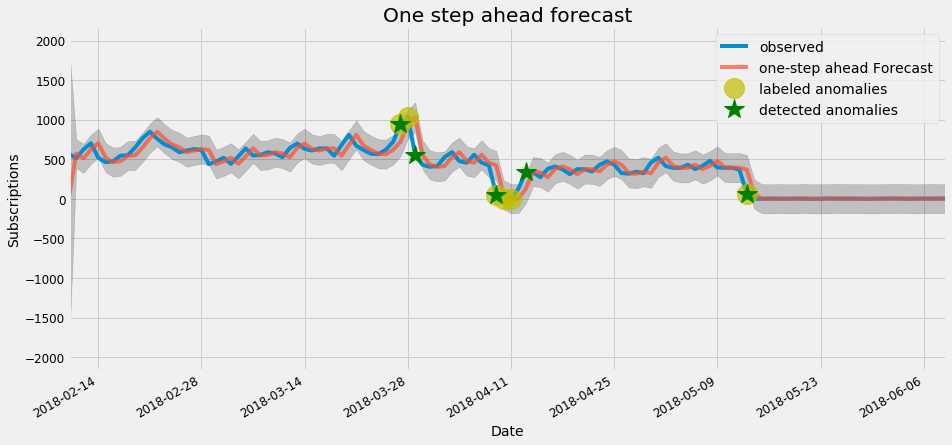

In [26]:
col = 'Event 22'
y_obs = df[col]
mod = sm.tsa.statespace.SARIMAX(y_obs,
                                order=(0,1, 0),
                                enforce_stationarity=True,
                                enforce_invertibility=False)
results = mod.fit()

pred = results.get_prediction(start=y_obs.index.min(), dynamic=False) #full history up to a point
pred_ci = pred.conf_int()
pred_mean = (pred.predicted_mean)
ax = y_obs.plot(label='observed')
pred_mean.plot(ax=ax, label='one-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.plot(alert[col]*y_obs, 'yo', markersize =20, alpha = 0.7, label = 'labeled anomalies')
ax.plot(y_obs[(y_obs < pred_ci['lower '+ col]) |( y_obs > pred_ci['upper '+ col])], 'g*', markersize = 20, label = 'detected anomalies')
ax.set_xlabel('Date')
ax.set_ylabel('Subscriptions')
ax.set_title('One step ahead forecast')
plt.legend()
plt.show()

In [27]:
stationarity = pd.DataFrame()
for col in df.columns:
    results_raw= adfuller(df[col])
    results_diff= adfuller(df[col].diff().dropna())
    results = pd.Series({'event': col.split(' ')[-1], 
                         't': results_raw[0],
                         'p': results_raw[1],
                         't_diff': results_diff[0],
                         'p_diff': results_diff[1]})
    stationarity = stationarity.append(results, ignore_index = True)

stationarity[stationarity['p_diff']<0.05]


# all of the events are either already stationary or can be made stationary with differencing

,event,p,p_diff,t,t_diff
0,1,9.796853e-03,1.175923e-03,-3.435816,-4.048697
1,2,3.979889e-22,3.172525e-16,-11.966954,-9.515109
2,3,1.061257e-01,1.123564e-03,-2.539636,-4.060798
3,4,2.591930e-02,2.463986e-04,-3.108655,-4.445479
4,5,2.421432e-01,1.568706e-24,-2.105914,-13.120227
5,6,1.170417e-01,8.324647e-04,-2.493590,-4.139584
6,7,2.741563e-14,3.145410e-04,-8.756793,-4.385759
7,8,7.121283e-01,2.089332e-05,-1.107359,-5.013230
8,9,1.153809e-01,3.255316e-14,-2.500384,-8.727665
9,10,2.190482e-01,6.309356e-12,-2.165383,-7.830569


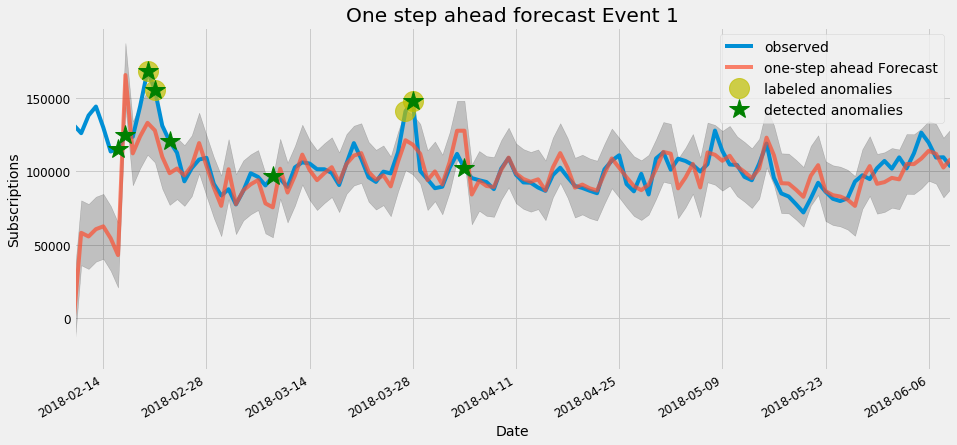

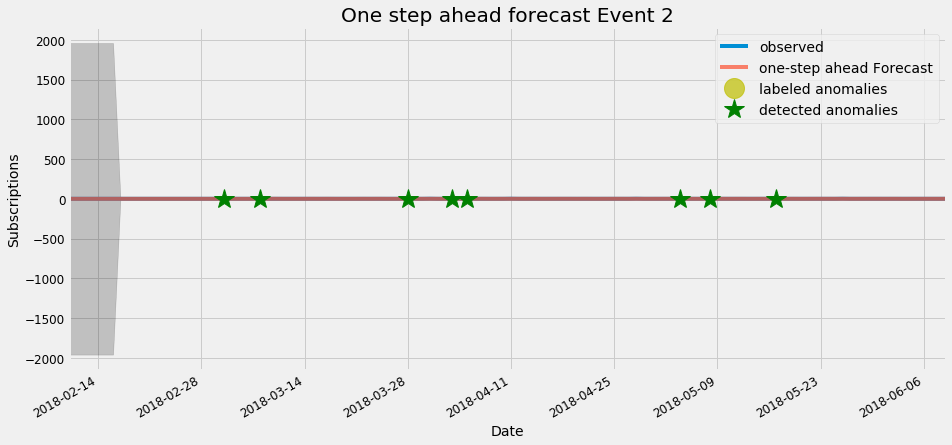

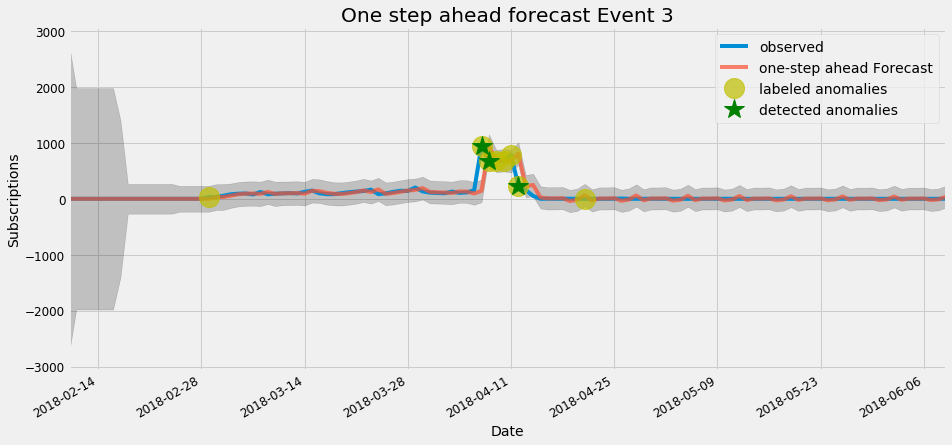

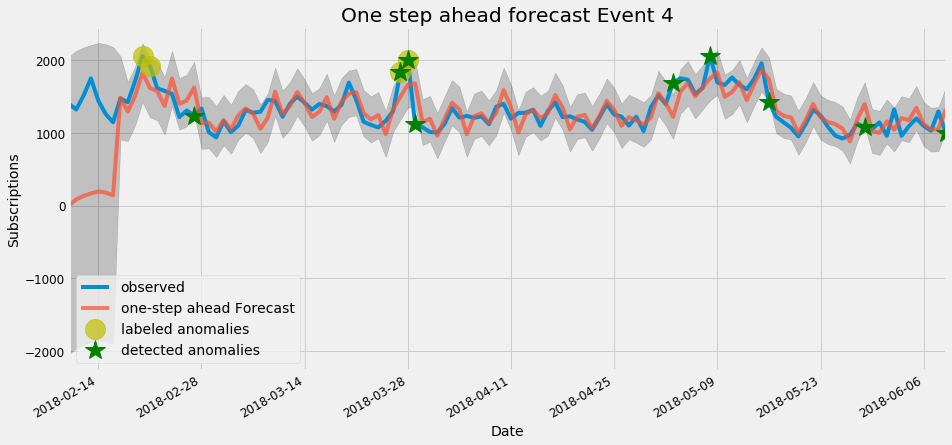

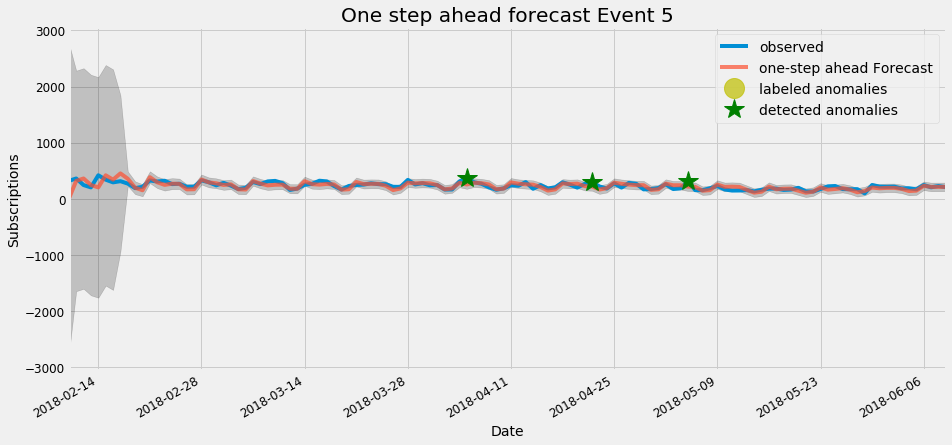

...

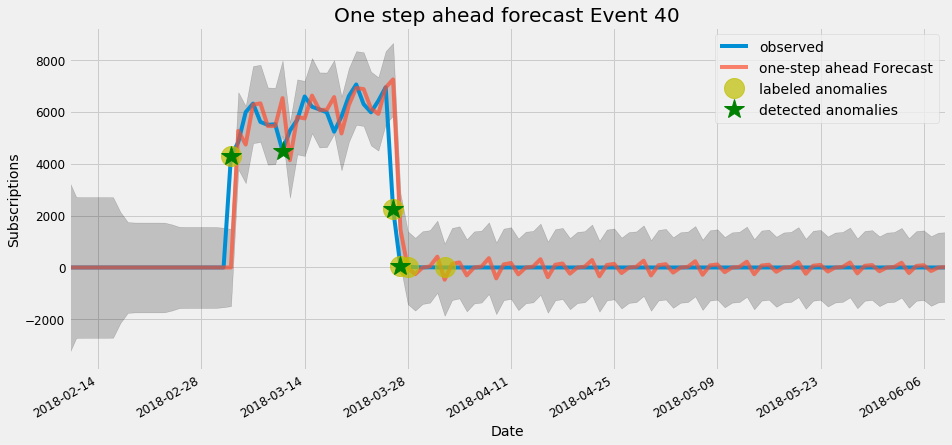

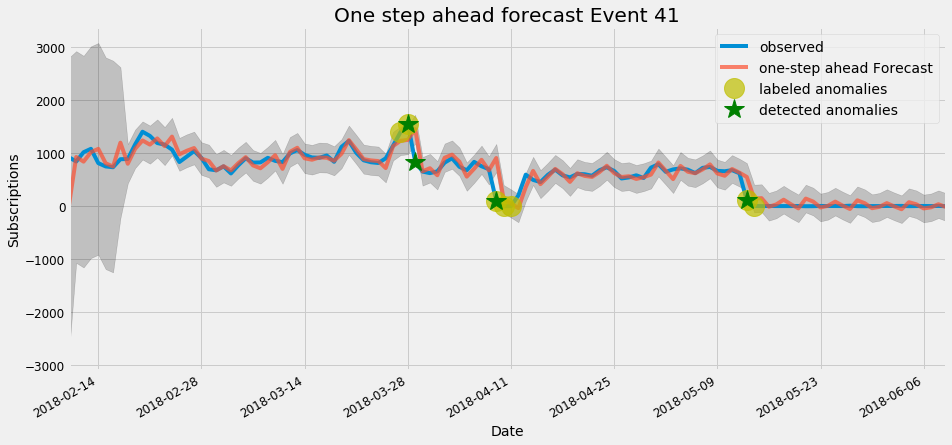

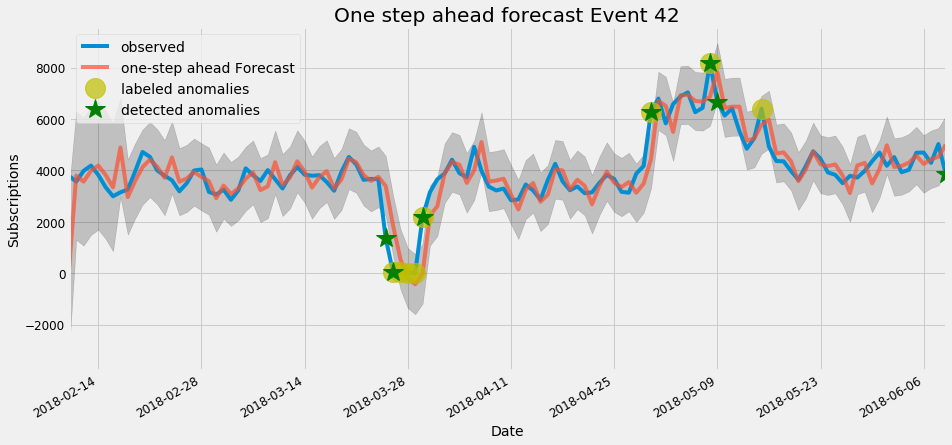

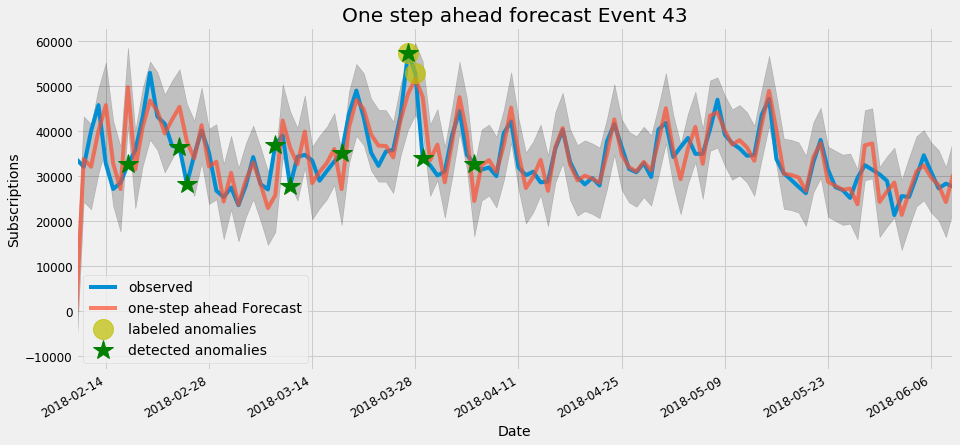

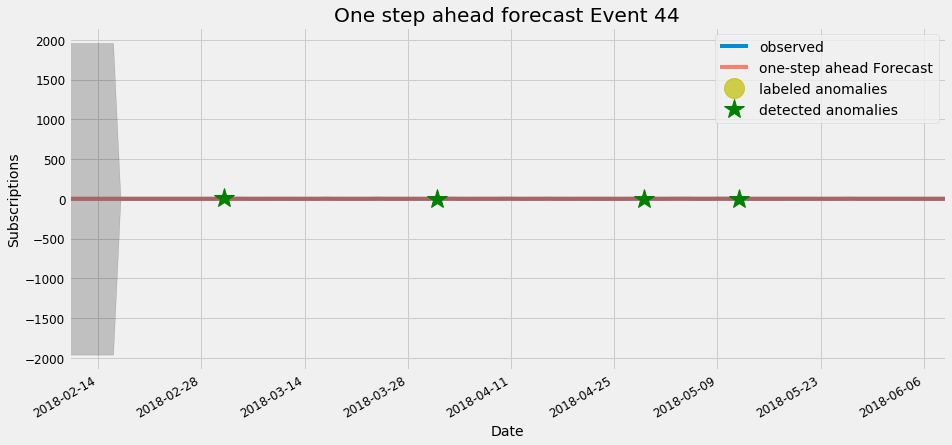

In [30]:
eval_ = pd.DataFrame()
for col in df.columns:
    y_obs = df[col]
    results_raw= adfuller(y_obs)
    results_diff= adfuller(y_obs.diff().dropna())
    results =  {'event': col.split(' ')[-1], 
                         't': results_raw[0],
                         'p': results_raw[1],
                         't_diff': results_diff[0],
                         'p_diff': results_diff[1]}
    if ((results['p']<0.05) & (results['t'] < -1)):
        d = 0
    else:
        d = 1

    results = pm.auto_arima(y_obs, 
                        d = d, 
                        start_p = 1, 
                        start_q = 0, 
                        max_p = 2, 
                        max_q = 2, 
                        seasonal = True,
                        m = 7,
                        D = 1,
                        start_P = 0, 
                        start_Q = 0, 
                        max_P = 2, 
                        max_Q = 2, 
                        information_criterion = 'bic',
                        error_action = 'ignore')
    mod = sm.tsa.statespace.SARIMAX(y_obs,
                                order=results.order,
                                seasonal_order = results.seasonal_order,
                                enforce_stationarity=True,
                                enforce_invertibility=False)
    results = mod.fit()

    pred = results.get_prediction(start=y_obs.index.min(), dynamic=False) #full history up to a point
    pred_ci = pred.conf_int()
    pred_mean = (pred.predicted_mean)
    ax = y_obs.plot(label='observed')
    pred_mean.plot(ax=ax, label='one-step ahead Forecast', alpha=.7, figsize=(14, 7))
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.plot(alert[col]*y_obs, 'yo', markersize =20, alpha = 0.7, label = 'labeled anomalies')
    
    detected = y_obs[((y_obs < pred_ci['lower '+ col]) |( y_obs > pred_ci['upper '+ col]))]
    detected = detected[pd.to_datetime('2018-02-16').date():]
    ax.plot(detected, 'g*', markersize = 20, label = 'detected anomalies')
    ax.set_xlabel('Date')
    ax.set_ylabel('Subscriptions')
    ax.set_title('One step ahead forecast ' + col)
    plt.legend()
    plt.show()
    
    r = pd.DataFrame({'truth': alert[col]})
    r['detected'] = detected.notnull().astype(int)
    r.fillna(0, inplace = True)
    eval_ = eval_.append(r)


In [31]:


tp = ((eval_['truth'] == 1) &  (eval_['detected'] ==1)).sum()
fp = ((eval_['truth'] == 0) &  (eval_['detected'] ==1)).sum()
tn = ((eval_['truth'] == 0) &  (eval_['detected'] ==0)).sum()
fn = ((eval_['truth'] == 1) &  (eval_['detected'] ==0)).sum()

precision = (tp/(tp+fp)) #ability of a classification model to return only relevant instances 
recall = (tp/(tp+fn)) #ability of a classification model to identify all relevant instances

print('precision', precision)
print('recall', recall)

precision 0.23107569721115537
recall 0.5


#### notes:
- the way the data are labeled is really important to precision and recall. need context to know which events can't be missed
- not one size fits all for all time series, all types of changes
- possibly measure performance of models by checking whether anomaly was detected within X window (2 days, for example). Often it's close but not spot on and is not counted.